In [2]:
pip install tensorflow opencv-python matplotlib


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install tensorflow-hub

Note: you may need to restart the kernel to use updated packages.


In [18]:
pip install tensorflow tensorflow-hub opencv-python matplotlib

Note: you may need to restart the kernel to use updated packages.


In [9]:
pip install --upgrade tensorflow tensorflow-hub

Note: you may need to restart the kernel to use updated packages.


Loading model...
INFO:tensorflow:Saver not created because there are no variables in the graph to restore
Model loaded successfully.
Press 'q' to quit.


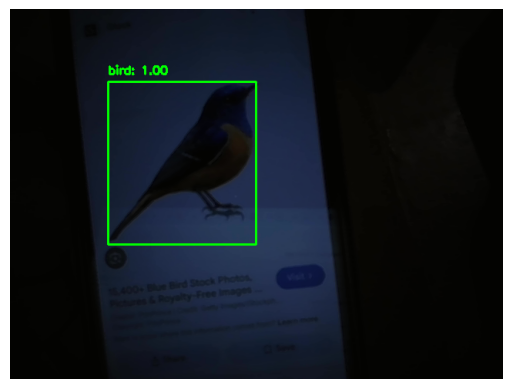

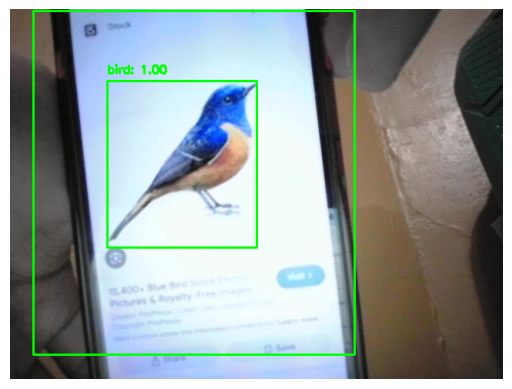

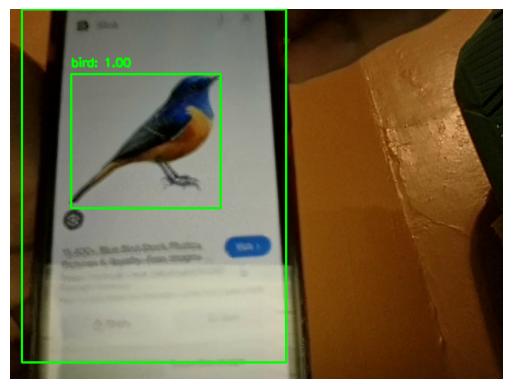

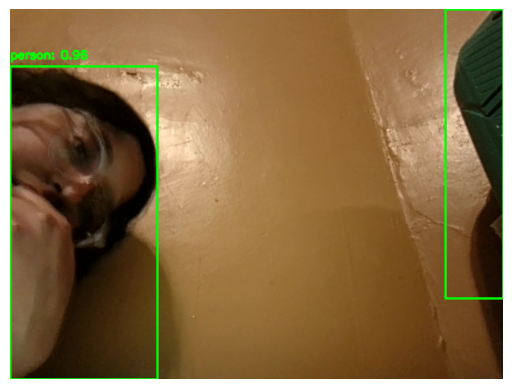

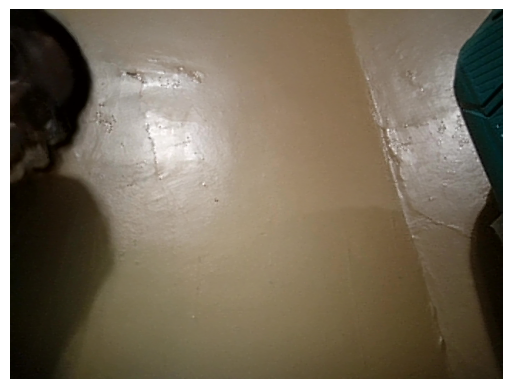

...

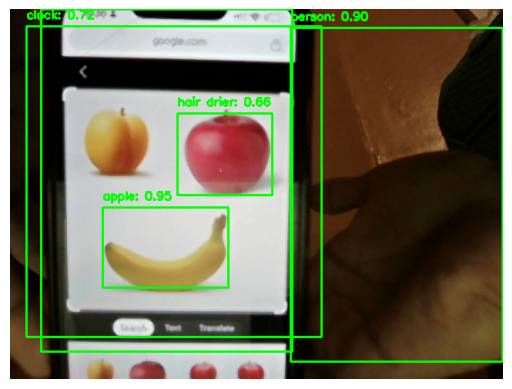

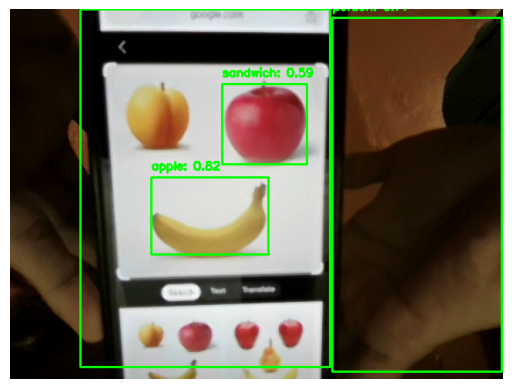

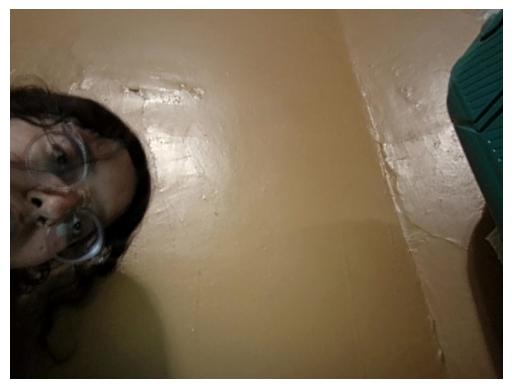

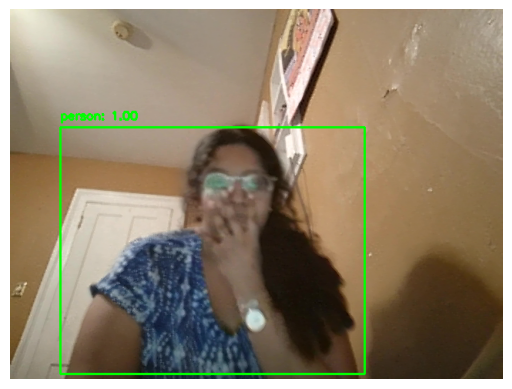

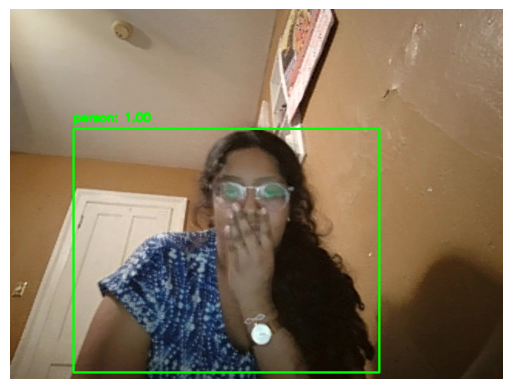

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt

# COCO class labels (for visualization)
COCO_CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 
    'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 
    'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 
    'N/A', 'backpack', 'umbrella', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 
    'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 
    'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 
    'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 
    'teddy bear', 'hair drier', 'toothbrush'
]

# Load the Faster R-CNN model from the saved model directory
def load_faster_rcnn_model(saved_model_path):
    """Load pre-trained Faster R-CNN model from the saved model directory."""
    model = tf.saved_model.load(saved_model_path)
    return model

# Perform object detection
def detect_objects(model, image_tensor):
    """Perform object detection using the Faster R-CNN model."""
    # Use the 'serving_default' signature to call the model
    inference_fn = model.signatures['serving_default']
    
    # Perform inference
    detections = inference_fn(image_tensor)
    
    # Extract detection data
    return {
        "detection_boxes": detections['detection_boxes'],
        "detection_scores": detections['detection_scores'],
        "detection_classes": detections['detection_classes'],
    }

# Process and visualize detections
def draw_detections(frame, detections, threshold=0.5):
    """Draw detections on the video frame."""
    img_height, img_width, _ = frame.shape

    detection_boxes = detections["detection_boxes"].numpy()[0]
    detection_scores = detections["detection_scores"].numpy()[0]
    detection_classes = detections["detection_classes"].numpy()[0].astype(np.int32)

    for box, score, cls in zip(detection_boxes, detection_scores, detection_classes):
        if score > threshold:
            ymin, xmin, ymax, xmax = box
            xmin, xmax = int(xmin * img_width), int(xmax * img_width)
            ymin, ymax = int(ymin * img_height), int(ymax * img_height)

            # Get the class name from the COCO class list
            class_name = COCO_CLASSES[cls]

            # Draw bounding box and label
            cv2.rectangle(frame, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
            label = f"{class_name}: {score:.2f}"
            cv2.putText(frame, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    return frame

# Start the webcam for dynamic object detection
def dynamic_object_detection():
    """Capture video and apply object detection dynamically."""
    print("Loading model...")
    model = load_faster_rcnn_model("C:\\Users\\chari\\Downloads\\faster_rcnn_inception_resnet_v2_atrous_coco_2018_01_28\\faster_rcnn_inception_resnet_v2_atrous_coco_2018_01_28\\saved_model")  # Specify the path to the saved model
    print("Model loaded successfully.")

    cap = cv2.VideoCapture(0)  # Change `0` to video file path for custom video
    if not cap.isOpened():
        print("Error: Could not open webcam.")
        return

    print("Press 'q' to quit.")
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            print("Error: Could not read frame.")
            break

        # Preprocess the frame
        frame_resized = cv2.resize(frame, (640, 640))  # Resize using OpenCV
        input_tensor = tf.convert_to_tensor(frame_resized, dtype=tf.uint8)  # Ensure uint8 type
        input_tensor = tf.expand_dims(input_tensor, axis=0)  # Add batch dimension

        # Perform detection
        detections = detect_objects(model, input_tensor)

        # Draw detections on the frame
        frame_with_detections = draw_detections(frame, detections)

        # Display the frame using matplotlib
        plt.imshow(cv2.cvtColor(frame_with_detections, cv2.COLOR_BGR2RGB))
        plt.axis('off')  # Turn off axes
        plt.show(block=False)
        plt.pause(0.001)  # Pause to update the plot
        plt.clf()  # Clear the figure for the next frame

    cap.release()
    cv2.destroyAllWindows()

# Run the dynamic object detection
if __name__ == "__main__":
    dynamic_object_detection()
